In [1]:
import sys, os
import re
import gc
import glob
import pandas as pd
import ast
import itertools
import numpy as np
from pathlib import Path

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
from tqdm.notebook import tqdm

tqdm.pandas()

In [4]:
import warnings
warnings.filterwarnings("ignore")

### Loading package

In [5]:
import sys
from pathlib import Path

here_path = Path().resolve()
repo_path = here_path.parents[1]
sys.path.append(str(repo_path))

In [6]:
from py.utils import verifyDir, verifyFile

In [7]:
from py.config import Config

cfg = Config()

np.random.seed(cfg.RANDOM_STATE)
cfg.DATA_PATH, cfg.MODEL_PATH

('/media/felipe/DATA22/datasets/', '/media/felipe/DATA22/models/')

### Loading data

In [8]:
DATA_PATH=f"{cfg.DATA_PATH}postcog/"
CSV_PATH = f"{DATA_PATH}/csv/"
THREADS_PROCESSED = f"{CSV_PATH}/topics/{cfg.TOPIC_SEARCH}/"

In [9]:
hf_cve_df = pd.read_csv(f"{THREADS_PROCESSED}/Websites_CVE_Posts.csv", sep="\t", low_memory=False, encoding='utf-8')
hf_cve_df["cve_codes_list"] = hf_cve_df["cve_codes_list"].apply(lambda x: ast.literal_eval(x))
hf_cve_df["cve_unique_list"] = hf_cve_df["cve_unique_list"].apply(lambda x: ast.literal_eval(x))
hf_cve_df["post_time"] = pd.to_datetime(hf_cve_df['post_time'], format='ISO8601').apply(lambda x: x.replace(tzinfo=None))
hf_cve_df["year"] = pd.DatetimeIndex(hf_cve_df['post_time']).year
hf_cve_df["cve_codes_len"] = hf_cve_df["cve_codes_list"].apply(lambda x: len(x) )
hf_cve_df["cve_unique_len"] = hf_cve_df["cve_unique_list"].apply(lambda x: len(x) )
hf_cve_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 15645 entries, 0 to 15644
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   id               15645 non-null  int64         
 1   thread_id        15645 non-null  int64         
 2   board_id         15645 non-null  int64         
 3   site_id          15645 non-null  int64         
 4   content          15645 non-null  str           
 5   timestamp        15645 non-null  str           
 6   thread_title     15644 non-null  str           
 7   board_title      15523 non-null  str           
 8   sitename         15645 non-null  str           
 9   intent           9801 non-null   str           
 10  posttype         9801 non-null   str           
 11  crime_type       15645 non-null  str           
 12  creator_id       14681 non-null  float64       
 13  creator          15587 non-null  str           
 14  post_time        15645 non-null  datetime64[us]
 

#### Users

In [10]:
# user_thread_df = pd.pivot_table(hf_cve_df, 
#                       index=["username"], 
#                       values=["cve_codes_len"],
#                       aggfunc={
#                           "cve_codes_len": len,
#                       }).rename(columns={"cve_codes_len": "num_cves"}).sort_values(by="num_cves", ascending=False)
# user_thread_df

In [11]:
# _, ax = plt.subplots(figsize=(16,8), nrows=1, ncols=1, sharex=False, sharey=False)

# user_cve_mean = round(user_thread_df["num_cves"].mean(), 2)
# user_cve_sum = user_thread_df["num_cves"].sum()
# df = user_thread_df.reset_index()

# sns_fig = sns.barplot(
#             data=df,
#             x=df.columns[0],
#             y=df.columns[1],
#             ax=ax,
#             color="steelblue",
#             order=df.sort_values(df.columns[1], ascending=False)[df.columns[0]].loc[:9]
#            )

# #sns_fig.set_title(f"Number of CVE-IDs cited per user, Total: {user_cve_sum}, Avg: {user_cve_mean}", fontsize=16)
# sns_fig.set_ylabel(f"Number of CVE-ID cited", fontsize=30)
# sns_fig.set_xlabel('Username', fontsize=30)

# # rotate the axis ticklabels
# _ = sns_fig.tick_params(axis='x', rotation=60, labelsize=30)

# # rotate the axis ticklabels
# _ = sns_fig.tick_params(axis='y', labelsize=25)

# # add annotation
# _ = sns_fig.bar_label(sns_fig.containers[0], fmt='%0.0f', fontsize=15)

# # add a space on y for the annotations
# #sns_fig.margins(x=0.1)

#### Boards

In [12]:
board_thread_df = pd.pivot_table(hf_cve_df, 
                      index=["board_title"], 
                      values=["thread_id"],
                      aggfunc={
                          "thread_id": len,
                      }).rename(columns={"thread_id": "num_thread"}).sort_values(by="num_thread", ascending=False)
board_thread_df.head(10)

,num_thread
board_title,
Premium Sellers Section,1223
Malicious Software,1097
Pentesting and Forensics,786
Noticias Informáticas,669
Bugtraq,571
Exploit PoCs,533
The Lounge,491
Новости,463
Website Hacking,420


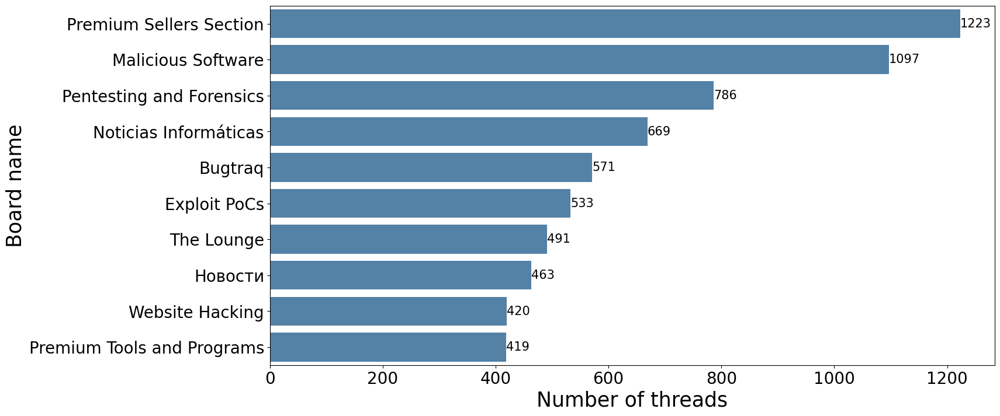

In [13]:
_, ax = plt.subplots(figsize=(16,8), nrows=1, ncols=1, sharex=False, sharey=False)

boards_thread_mean = round(board_thread_df["num_thread"].mean(), 2)
boards_thread_sum = board_thread_df["num_thread"].sum()
df = board_thread_df.reset_index()

sns_fig = sns.barplot(
            data=df,
            x=df.columns[1],
            y=df.columns[0],
            orient="h",
            ax=ax,
            color="steelblue",
            order=df.sort_values(df.columns[1], ascending=False)[df.columns[0]].loc[:9]
           )

# sns_fig.set_title(f"Number of threads per board, Total: {boards_thread_sum}, Avg: {boards_thread_mean}", fontsize=16)
sns_fig.set_ylabel(f"Board name", fontsize=25)
sns_fig.set_xlabel('Number of threads', fontsize=25)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='x', rotation=0, labelsize=20)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='y', labelsize=20)

# add annotation
_ = sns_fig.bar_label(sns_fig.containers[0], fmt='%0.0f', fontsize=15)

# add a space on y for the annotations
#sns_fig.margins(x=0.1)

#### CVEs

In [14]:
cve_codes_year_df = hf_cve_df[["year", "cve_codes_list"]].copy().groupby(by=["year"])["cve_codes_list"].apply(list).reset_index().set_index("year")
cve_codes_year_df["num_posts"] = cve_codes_year_df["cve_codes_list"].apply(lambda x: len(x))

cve_codes_year_df["cve_codes"] = cve_codes_year_df["cve_codes_list"].apply(lambda x: list(itertools.chain(*x)))
cve_codes_year_df["num_cve_codes"] = cve_codes_year_df["cve_codes"].apply(lambda x: len(x))

cve_codes_year_df["cve_codes_unique"] = cve_codes_year_df["cve_codes"].apply(lambda x: list(set(x)))
cve_codes_year_df["num_cve_codes_unique"] = cve_codes_year_df["cve_codes_unique"].apply(lambda x: len(x))

cve_codes_year_df

,cve_codes_list,num_posts,cve_codes,num_cve_codes,cve_codes_unique,num_cve_codes_unique
year,,,,,,
2004,"[[cve-1999-0082, cve, cve], [cve-2008-5187, cv...",2,"[cve-1999-0082, cve, cve, cve-2008-5187, cve20...",5,"[cve-1999-0082, cve20085187-, cve-2008-5187, cve]",4
2006,"[[cve-2006-1376, cve-2006-4089, cve-2006-3849,...",7,"[cve-2006-1376, cve-2006-4089, cve-2006-3849, ...",78,"[cve-2006-4089, cve-2006-1168, cve-2006-3628, ...",36
2007,"[[cve, cve-2005-4659, cve, cve-2005-4659], [cv...",7,"[cve, cve-2005-4659, cve, cve-2005-4659, cve, ...",13,"[cve, cve-2005-4659, cve-2007-3855]",3
2008,"[[cve-2005-0560, cve-2005-3683, cve-2006-4379,...",33,"[cve-2005-0560, cve-2005-3683, cve-2006-4379, ...",78,"[cve-2005-0560, cve-2008-1334, cve-2007-4440, ...",33
2009,"[[cve-2008-2371, cve-2008-3658, cve-2008-3659,...",51,"[cve-2008-2371, cve-2008-3658, cve-2008-3659, ...",103,"[cve-2009-2935, cve-2007-4887, cve-2009-1492, ...",39
2010,"[[cve-1999-0504, cve-2000-0222, cve-1999-0505,...",228,"[cve-1999-0504, cve-2000-0222, cve-1999-0505, ...",533,"[cve-2010-0094, cve-2005-3595, cve-2009-3099, ...",93
2011,"[[cve, cve-2006-0003, cve-2010-0806, cve-2008-...",232,"[cve, cve-2006-0003, cve-2010-0806, cve-2008-2...",648,"[cve-2011-2110, cve-2011-0037, cve-2011-1266, ...",185
2012,"[[cve-2008-2992, cve-2010-0188, cve-2010-0842,...",650,"[cve-2008-2992, cve-2010-0188, cve-2010-0842, ...",1137,"[cve-2000-0011, cve-2012-0831, cve-2009-1136, ...",320
2013,"[[cve-2008-5499, cve-2008-5499, cve-2010-0480,...",1078,"[cve-2008-5499, cve-2008-5499, cve-2010-0480, ...",1719,"[cve-2006-3677, cve-2010-4452, cve-2012-0831, ...",312


#### Number of Posts

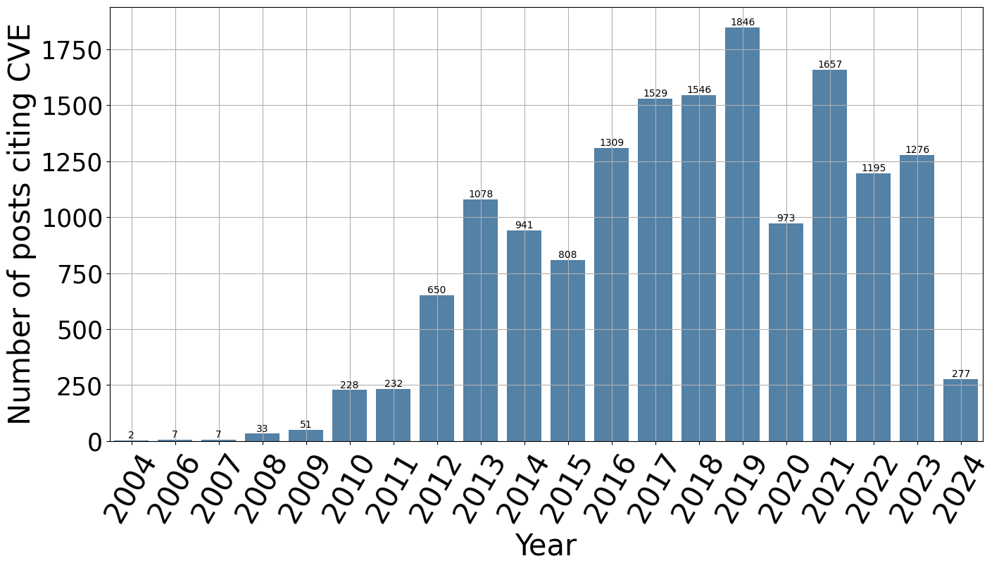

In [15]:
_, ax = plt.subplots(figsize=(16,8), nrows=1, ncols=1, sharex=False, sharey=False)

cve_codes_year_df_ = cve_codes_year_df[["num_posts"]].copy()
years_mean = cve_codes_year_df_["num_posts"].mean()
df = cve_codes_year_df_.reset_index()

sns_fig = sns.barplot(
            data=df,
            x=df.columns[0],
            y=df.columns[1],
            ax=ax,
            color="steelblue",
          )

#sns_fig.set_title(f"Top {top_k_cves} CVEs cited", fontsize=16)
sns_fig.set_xlabel('Year', fontsize=30)
sns_fig.set_ylabel(f"Number of posts citing {cfg.TOPIC_SEARCH.upper()}", fontsize=30)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='x', rotation=60, labelsize = 30)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='y', rotation=0, labelsize = 25)

# add annotation
_ = sns_fig.bar_label(sns_fig.containers[0], fmt='%0.0f')

ax.grid(True)

#### Number of CVEs cited by year

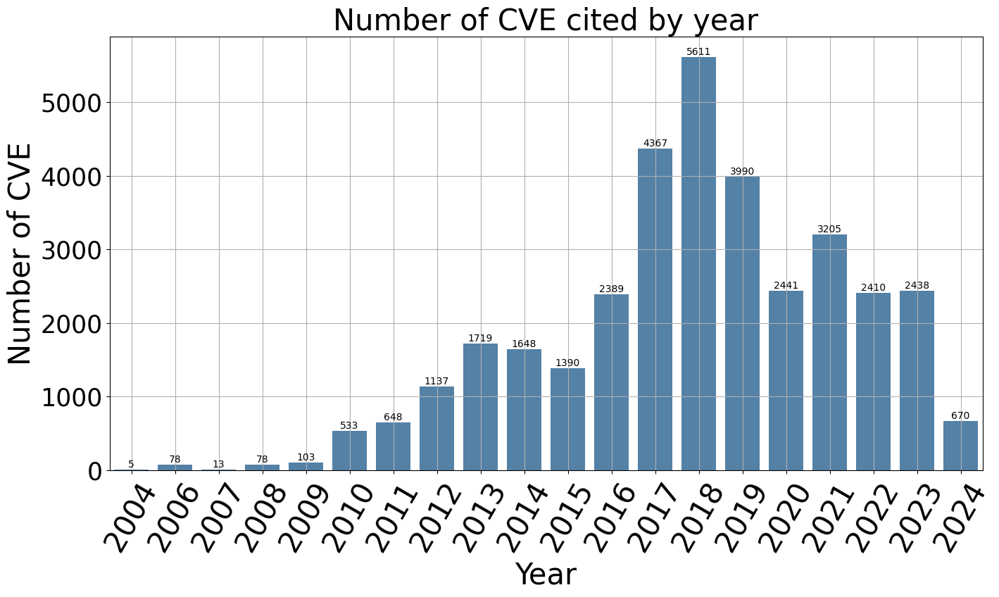

In [16]:
_, ax = plt.subplots(figsize=(16,8), nrows=1, ncols=1, sharex=False, sharey=False)

cve_codes_year_df_ = cve_codes_year_df[["num_cve_codes"]].copy()
years_mean = cve_codes_year_df_["num_cve_codes"].mean()
df = cve_codes_year_df_.reset_index()

sns_fig = sns.barplot(
            data=df,
            x=df.columns[0],
            y=df.columns[1],
            ax=ax,
            color="steelblue",
          )

sns_fig.set_title(f"Number of CVE cited by year", fontsize=30)
sns_fig.set_xlabel('Year', fontsize=30)
sns_fig.set_ylabel(f"Number of CVE", fontsize=30)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='x', rotation=60, labelsize = 30)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='y', rotation=0, labelsize = 25)

# add annotation
_ = sns_fig.bar_label(sns_fig.containers[0], fmt='%0.0f')

ax.grid(True)

#### Number of Unique CVEs

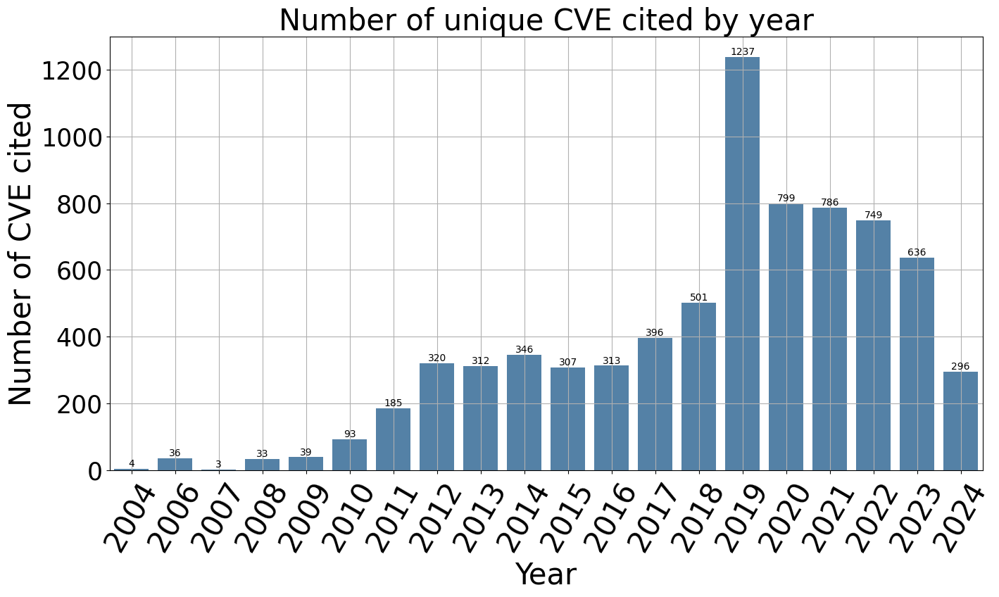

In [17]:
_, ax = plt.subplots(figsize=(16,8), nrows=1, ncols=1, sharex=False, sharey=False)

cve_codes_year_df_ = cve_codes_year_df[["num_cve_codes_unique"]].copy()
years_mean = cve_codes_year_df_["num_cve_codes_unique"].mean()
df = cve_codes_year_df_.reset_index()

sns_fig = sns.barplot(
            data=df,
            x=df.columns[0],
            y=df.columns[1],
            ax=ax,
            color="steelblue",
          )

sns_fig.set_title(f"Number of unique CVE cited by year", fontsize=30)
sns_fig.set_xlabel('Year', fontsize=30)
sns_fig.set_ylabel(f"Number of CVE cited", fontsize=30)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='x', rotation=60, labelsize = 30)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='y', rotation=0, labelsize = 25)

# add annotation
_ = sns_fig.bar_label(sns_fig.containers[0], fmt='%0.0f')

ax.grid(True)

### Loading Data Threads

In [18]:
CATEGORY="chatgpt_crimetype"

In [19]:
hf_threads_df = pd.read_csv(f"{THREADS_PROCESSED}Websites_LLM_Labels.csv", sep='\t', low_memory=False)
hf_threads_df["cve_unique_list"] = hf_threads_df["cve_unique_list"].apply(ast.literal_eval)
hf_threads_df["cve_codes_list"] = hf_threads_df["cve_codes_list"].apply(ast.literal_eval)
hf_threads_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 6443 entries, 0 to 6442
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   sitename              6443 non-null   str    
 1   board_title           6443 non-null   str    
 2   thread_title          6443 non-null   str    
 3   thread_id             6443 non-null   int64  
 4   content               6443 non-null   str    
 5   crimetype             6443 non-null   str    
 6   cve_codes_list        6443 non-null   object 
 7   intention             6443 non-null   str    
 8   posttype              6443 non-null   str    
 9   cve_unique_list       6443 non-null   object 
 10  r_IMG                 6443 non-null   str    
 11  r_CITING              6443 non-null   str    
 12  r_IFRAME              6443 non-null   str    
 13  r_LINK                6443 non-null   str    
 14  r_CODE                6443 non-null   str    
 15  r_ATTACHMENT          6443 non-n

In [20]:
hf_threads_df["lang_detected"].value_counts()

lang_detected
english       3228
russian       1967
spanish       1223
portuguese      21
deutsch          4
Name: count, dtype: int64

In [21]:
# LANGUAGE_TO_EVAL=[lang for lang in data_df["lang_detected"].unique() if lang!="not found"]
LANGUAGE_TO_EVAL=["english"]
hf_threads_df = hf_threads_df[hf_threads_df["lang_detected"].isin(LANGUAGE_TO_EVAL)].copy()
hf_threads_df.reset_index(inplace=True, drop=True)
hf_threads_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 3228 entries, 0 to 3227
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   sitename              3228 non-null   str    
 1   board_title           3228 non-null   str    
 2   thread_title          3228 non-null   str    
 3   thread_id             3228 non-null   int64  
 4   content               3228 non-null   str    
 5   crimetype             3228 non-null   str    
 6   cve_codes_list        3228 non-null   object 
 7   intention             3228 non-null   str    
 8   posttype              3228 non-null   str    
 9   cve_unique_list       3228 non-null   object 
 10  r_IMG                 3228 non-null   str    
 11  r_CITING              3228 non-null   str    
 12  r_IFRAME              3228 non-null   str    
 13  r_LINK                3228 non-null   str    
 14  r_CODE                3228 non-null   str    
 15  r_ATTACHMENT          3228 non-n

#### Labels

In [22]:
def make_sorter(l):
    """
    Create a dict from the list to map to 0..len(l)
    Returns a mapper to map a series to this custom sort order
    """
    sort_order = {k:v for k,v in zip(l, range(len(l)))}
    return lambda s: s.map(lambda x: sort_order[x])

In [23]:
boards_titles_ = board_thread_df.index.values[:10]
boards_titles_

<ArrowStringArray>
[   'Premium Sellers Section',         'Malicious Software',
   'Pentesting and Forensics',      'Noticias Informáticas',
                    'Bugtraq',               'Exploit PoCs',
                 'The Lounge',                    'Новости',
            'Website Hacking', 'Premium Tools and Programs']
Length: 10, dtype: str

In [24]:
labels_df = pd.DataFrame({'count' :  hf_threads_df.groupby(["board_title", CATEGORY]).size() }).reset_index()
labels_df = labels_df[labels_df["board_title"].isin(boards_titles_)].copy()
labels_df.sort_values(by='board_title', key=make_sorter(boards_titles_), inplace=True)
labels_df

,board_title,chatgpt_crimetype,count
277,Premium Sellers Section,not criminal,70
275,Premium Sellers Section,cybercrime activities,58
276,Premium Sellers Section,cybercrime support services,6
211,Malicious Software,cybercrime activities,10
213,Malicious Software,not criminal,21
212,Malicious Software,cybercrime support services,1
270,Pentesting and Forensics,cybercrime support services,5
269,Pentesting and Forensics,cybercrime activities,46
271,Pentesting and Forensics,not criminal,223
254,Noticias Informáticas,not criminal,1


#### Boards

In [25]:
board_thread_labels_df = pd.pivot_table(hf_threads_df, 
                      index=["board_title", CATEGORY], 
                      values=["thread_id"],
                      aggfunc={
                          "thread_id": len,
                      }).reset_index().rename(columns={"thread_id": "num_thread"}).sort_values(by=["board_title", CATEGORY,"num_thread"], ascending=False)
board_thread_labels_df

,board_title,chatgpt_crimetype,num_thread
467,قسم المشاكل والإستفسارات,not criminal,1
466,قسم الثغرات,not criminal,3
465,قسم الثغرات,cybercrime activities,3
464,قسم الإختراق بالميتاسبلوت والإتصال العكسي,not criminal,2
463,قسم الإختراق بالميتاسبلوت والإتصال العكسي,cybercrime activities,2
...,...,...,...
4,Advanced Hacking,not criminal,13
3,Advanced Hacking,cybercrime activities,2
2,Achievements & Bragging,not criminal,1
1,ARMA 2,not criminal,2


In [26]:
board_thread_labels_df = board_thread_labels_df[(board_thread_labels_df["board_title"].isin(boards_titles_))]
board_thread_labels_df.sort_values(by='board_title', inplace=True)#, key=make_sorter(boards_titles_) )
board_thread_labels_df

,board_title,chatgpt_crimetype,num_thread
46,Bugtraq,not criminal,81
45,Bugtraq,cybercrime support services,1
44,Bugtraq,cybercrime activities,7
121,Exploit PoCs,not criminal,19
120,Exploit PoCs,cybercrime support services,2
119,Exploit PoCs,cybercrime activities,2
213,Malicious Software,not criminal,21
212,Malicious Software,cybercrime support services,1
211,Malicious Software,cybercrime activities,10
254,Noticias Informáticas,not criminal,1


#### Labels Wordclouds

In [27]:
class_labels = hf_threads_df[CATEGORY].unique()
class_labels

<ArrowStringArray>
['not criminal', 'cybercrime activities', 'cybercrime support services']
Length: 3, dtype: str

In [28]:
language_list = ["russian", "german", "english"]

lang_df = hf_threads_df[hf_threads_df["lang_detected"].isin(language_list)]

documents_content = lang_df["content"].values

In [29]:
from py.nlpToolkit import WordCloudPlotter

wc = WordCloudPlotter(language_to_process=language_list,
                      mask=None, 
                      exclude_pipe=['morphologizer', "parser", "tagger", 'attribute_ruler', "ner"],
                     )

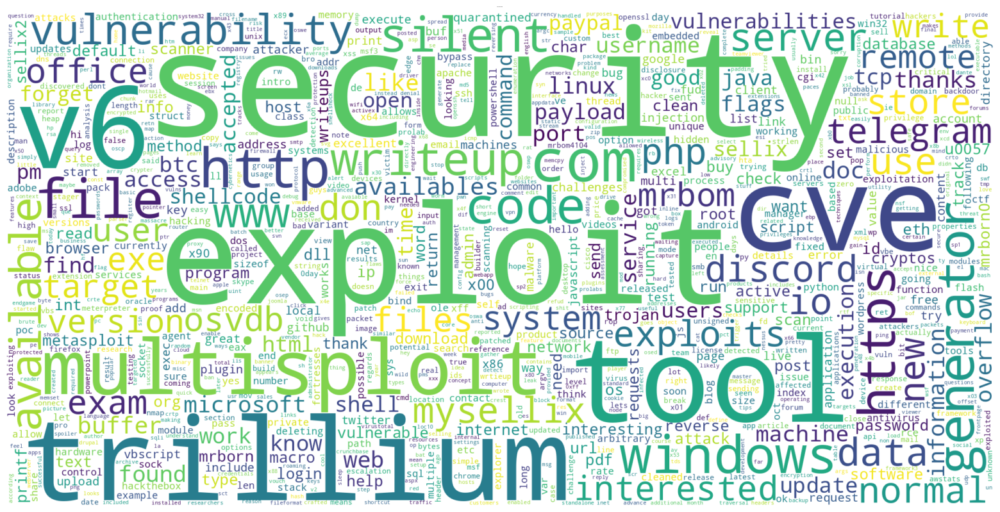

CPU times: user 40.5 s, sys: 1.38 s, total: 41.9 s
Wall time: 2min 47s


In [30]:
%%time
wc.calculate_words_frequency(documents_content, languages_list=language_list)
wc.plotWordCloud(f"All-Wordcloud", fontsize=0)

NOT CRIMINAL-Wordcloud


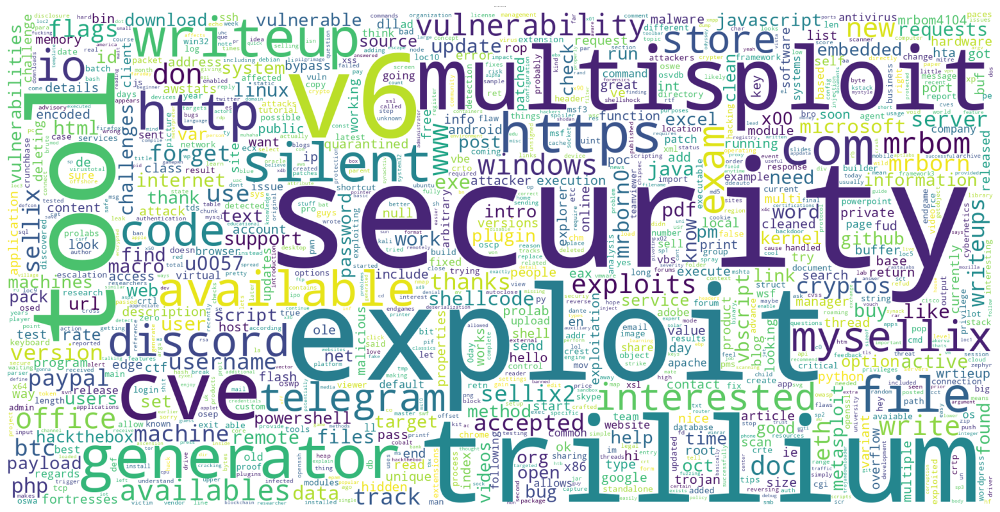

CYBERCRIME ACTIVITIES-Wordcloud


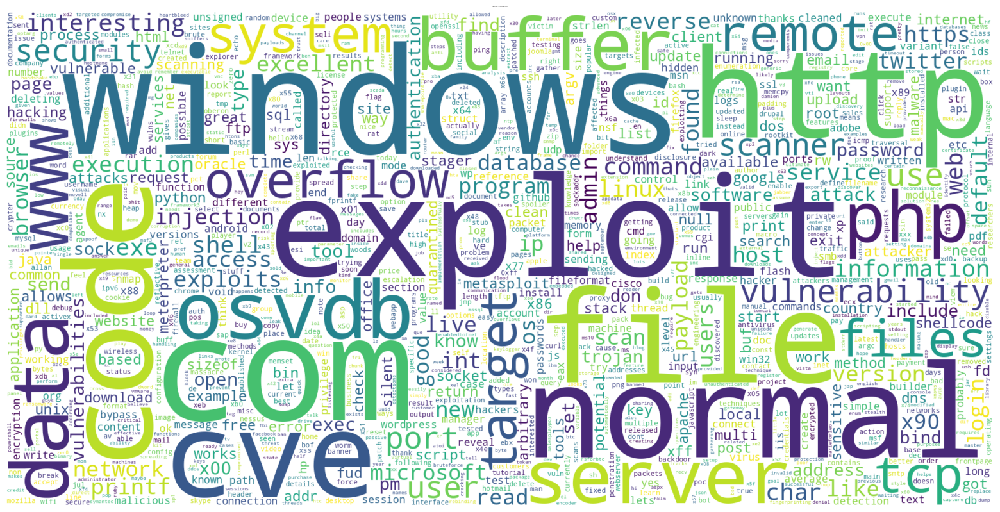

CYBERCRIME SUPPORT SERVICES-Wordcloud


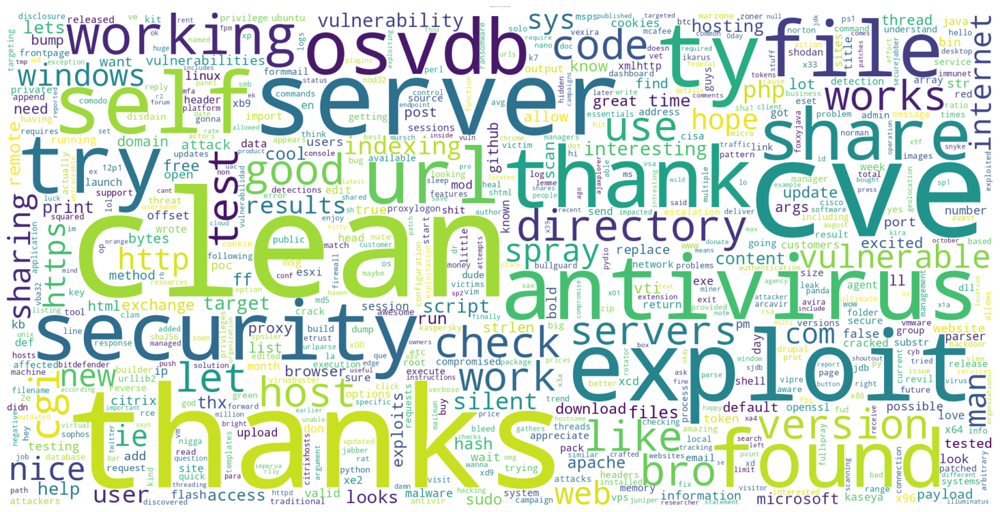

CPU times: user 54.6 s, sys: 2.21 s, total: 56.8 s
Wall time: 3min 47s


In [31]:
%%time
for topic_word in class_labels:
    
    documents_content = lang_df[lang_df[CATEGORY]==topic_word]["content"].values
    
    if len(documents_content)==0:
        continue
        
    wc.calculate_words_frequency(documents_content, languages_list=language_list)
    print(f"{topic_word.upper()}-Wordcloud")
    wc.plotWordCloud(f"{topic_word.upper()}-Wordcloud", fontsize=0)
    

#### Most CVE cited

In [32]:
cve_unique_code_list = list(set(itertools.chain(*hf_threads_df["cve_unique_list"].values)))
cve_total_code_list = list(itertools.chain(*hf_threads_df["cve_codes_list"].values))
len(cve_unique_code_list), len(cve_total_code_list), cve_total_code_list

(2340,
 22922,
 ['cve',
  'cve-',
  'cve-2020-28588',
  'cve-2018-3639',
  'cve-2019-7308',
  'cve-2018-3639',
  'cve-2019-7308',
  'cve-2017-18344',
  'cve-2017-18344',
  'cve-2017-18344',
  'cve-2017-18344',
  'cve-2017-1000380',
  'cve-2017-7616',
  'cve-2010-3437',
  'cve-2009-2910',
  'cve-2009-3001',
  'cve-',
  'cve-',
  'cve-2021-34866',
  'cve-2021-34866',
  'cve-2021-3490',
  'cve-2021-0399',
  'cve-2021-28663',
  'cve-2020-0423',
  'cve-2017-11176',
  'cve-2017-11176',
  'cve-2021-33909',
  'cve-2021-33909',
  'cve-2021-22555',
  'cve-2021-22555',
  'cve-2021-3492',
  'cve-2021-3492',
  'cve-2021-20226',
  'cve-2021',
  'cve-2021-32606',
  'cve-2021-32606',
  'cve-2021-3609',
  'cve-2021-3609',
  'cve-2021-3573',
  'cve-2021-3573',
  'cve-2021-3493',
  'cve-2020-28343',
  'cve-2021-20226',
  'cve-2021-20226',
  'cve-2021-27365',
  'cve-2021-27363',
  'cve-2021-27364',
  'cve-2021-26708',
  'cve-2021-26708',
  'cve-2021-26708',
  'cve-2014-3153',
  'cve-2014-3153',
  'cve-202

In [33]:
from collections import Counter
cve_freq_dict = dict(Counter(cve_total_code_list))
cve_freq_dict = dict(sorted(cve_freq_dict.items(), key=lambda x:x[1], reverse=True))
cve_freq_dict = {k.upper(): v for k, v in cve_freq_dict.items()}
len(cve_freq_dict), cve_freq_dict

(2340,
 {'CVE': 5051,
  'CVE-2017-0199': 1510,
  'CVE-2017-8759': 1101,
  'CVE-2017': 794,
  'CVE-2016': 755,
  'CVE-2017-11882': 710,
  'CVE-2017-8570': 655,
  'CVE-2012-0158': 617,
  'CVE-2015-1641': 536,
  'CVE-2015': 530,
  'CVE-2018-0802': 276,
  'CVE-2023-22809': 259,
  'CVE1': 226,
  'CVE-2012-4681': 223,
  'CVE-2023-21716': 217,
  'CVE-2019-0708': 190,
  'CVE-2014-6271': 177,
  'CVE-2018-20250': 172,
  'CVE-2014-0160': 159,
  'CVE-2022-22963': 140,
  'CVE-': 136,
  'CVE-0802': 135,
  'CVE-2010-3333': 121,
  'CVE-2022-40684': 113,
  'CVE-2021-44228': 110,
  'CVE-2018-7600': 103,
  'CVE-2023-32315': 94,
  'CVE-2014-6278': 92,
  'CVE-2008-5353': 81,
  'CVE-2015-0311': 71,
  'CVE-2017-7494': 68,
  'CVE-2011-3544': 62,
  'CVE-2010-0094': 56,
  'CVE-2015-1650': 53,
  'CVE-2013-0431': 52,
  'CVE-2015-5119': 50,
  'CVE-2012-0507': 49,
  'CVE-2012-5076': 43,
  'CVE-2013-0422': 43,
  'CVE-2018-4878': 43,
  'CVE-2014-0497': 42,
  'CVE-2014-1761': 40,
  'CVE-2017-0037': 40,
  'CVE-2010-018

In [34]:
cves_codes_freq_df = pd.DataFrame(data={"codes": list(cve_freq_dict.keys()), "counts": list(cve_freq_dict.values())})

In [35]:
cves_codes_freq_df["freqs"] = cves_codes_freq_df["counts"].apply(lambda x: x/cves_codes_freq_df["counts"].sum())

In [36]:
# cves_codes_freq_df["epss"] = cves_codes_freq_df["codes"].apply(lambda x: epss_cve_mapper[x.lower()])
# cves_codes_freq_df["cvss_v2"] = cves_codes_freq_df["codes"].apply(lambda x: cvss_cve_mapper_v2[x.lower()])
# cves_codes_freq_df["cvss_v3"] = cves_codes_freq_df["codes"].apply(lambda x: cvss_cve_mapper_v3[x.lower()])
# # label_map = dict(zip(labels_df[labels_col_name], labels_df[Y_col_name]))

In [37]:
cves_codes_freq_df

,codes,counts,freqs
0,CVE,5051,0.220356
1,CVE-2017-0199,1510,0.065876
2,CVE-2017-8759,1101,0.048032
3,CVE-2017,794,0.034639
4,CVE-2016,755,0.032938
...,...,...,...
2335,CVE-2021-28310,1,0.000044
2336,CVE-2019-1457,1,0.000044
2337,CVE-2020-12301,1,0.000044
2338,CVE-2021-33766,1,0.000044


In [38]:
cve_codes_freq_mean = cves_codes_freq_df["counts"].mean()

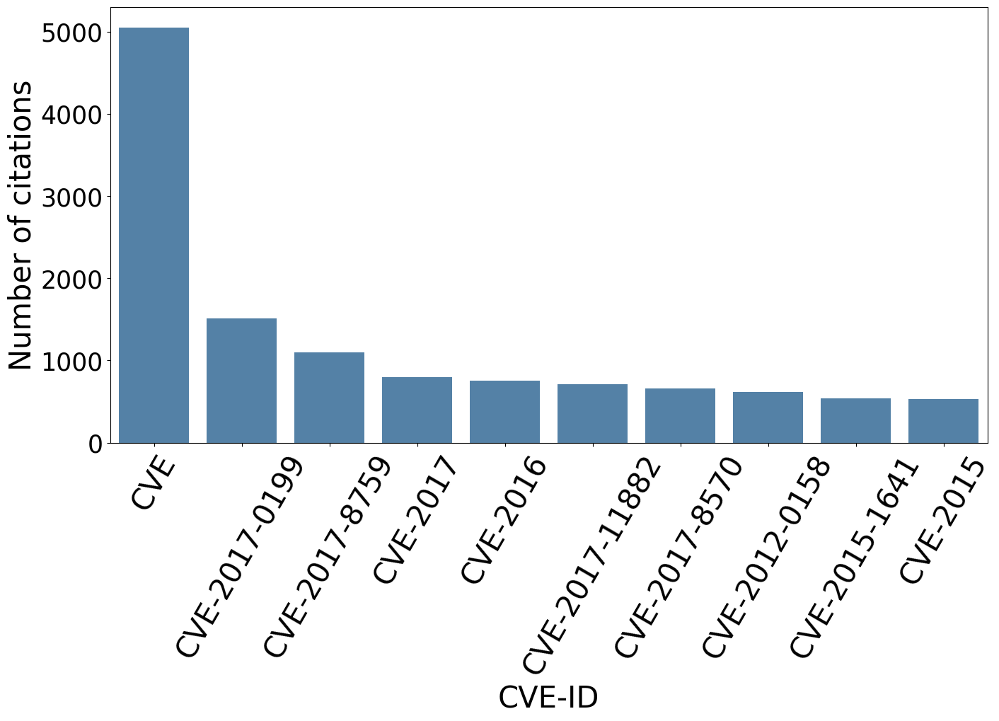

In [39]:
_, ax = plt.subplots(figsize=(16,8), nrows=1, ncols=1, sharex=False, sharey=False)

df = cves_codes_freq_df.copy()

top_k_cves = 9

sns_fig = sns.barplot(
            data=df,
            x=df.columns[0],
            y=df.columns[1],
            color="steelblue",
            ax=ax,
            order=df.sort_values(df.columns[1], ascending=False)[df.columns[0]].loc[:top_k_cves]
          )

#sns_fig.set_title(f"Top {top_k_cves} CVEs cited", fontsize=16)
sns_fig.set_xlabel('CVE-ID', fontsize=30)
sns_fig.set_ylabel(f"Number of citations", fontsize=30)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='x', rotation=60, labelsize = 30)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='y', rotation=0, labelsize = 25)

# add annotation
#_ = sns_fig.bar_label(sns_fig.containers[0], fmt='%0.0f')

# for i, p in enumerate(ax.patches):
#     ax.annotate(str(int(p.get_height())), 
#                 xy=(p.get_x() + p.get_width()/3,  p.get_height()),
#                 xytext=(10, 0),  # 3 points vertical offset
#                 textcoords="offset points",
#                 ha='center', va='bottom')

### Getting EPSS-CVSS Scores and Exploit Time series

In [40]:
from py.vulnerability import Vulnerability

vuln_processer = Vulnerability()
vuln_processer.set_cve_list(cve_list=cve_unique_code_list)

In [41]:
if not verifyFile(f"{THREADS_PROCESSED}/Websites_Exploit_CVSS_and_EPSS.csv"):
    vuln_processer.search_info(log=True)
    vuln_processer.save_data(f"{THREADS_PROCESSED}/Websites_Exploit_CVSS_and_EPSS.csv")
else:
    vuln_processer.read_data(f"{THREADS_PROCESSED}/Websites_Exploit_CVSS_and_EPSS.csv")

  0%|          | 0/2340 [00:00<?, ?it/s]

In [42]:
vuln_df = vuln_processer.get_data()
vuln_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 2340 entries, 0 to 2339
Data columns (total 31 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   cve_code            2340 non-null   str   
 1   publication_date    967 non-null    object
 2   status              967 non-null    object
 3   name                415 non-null    object
 4   description         967 non-null    object
 5   cvss_type_v3        967 non-null    object
 6   cvss_attack_v3      967 non-null    object
 7   authentication_v3   967 non-null    object
 8   cvss_complexity_v3  967 non-null    object
 9   confidentiality_v3  967 non-null    object
 10  availability_v3     967 non-null    object
 11  integrity_v3        967 non-null    object
 12  cvss_score_v3       967 non-null    object
 13  cvss_severity_v3    967 non-null    object
 14  exploit_score_v3    967 non-null    object
 15  impact_score_v3     967 non-null    object
 16  cvss_type_v2        791 non-null   

#### Exploit Time Series

In [43]:
# exploit_time_mapper = vuln_processer.get_vuln_info_mapper(col_name="exploit_times_series")
# exploit_time_mapper

In [44]:
# vuln_df[~vuln_df["exploit_times_series"].isna()]

In [45]:
# times_dict = vuln_df[~vuln_df["exploit_times_series"].isna()]["exploit_times"].values
# dates_dict = vuln_df[~vuln_df["exploit_times_series"].isna()]["exploit_dates"].values

In [46]:
# dates_dict.update(times_dict)

In [47]:
# exploit_series_df = pd.DataFrame(data=dates_dict)

In [48]:
# exploit_series_df.plot()

### EPSS and CVSS

#### Creating mappers

In [49]:
epss_cve_mapper = vuln_processer.get_info_mapper(col_name="epss_score")

cvss_cve_mapper_v2 = vuln_processer.get_info_mapper(col_name="cvss_score_v2")
cvss_cve_severity_mapper_v2 = vuln_processer.get_info_mapper(col_name="cvss_severity_v2")
cvss_cve_exploit_mapper_v2 = vuln_processer.get_info_mapper(col_name="exploit_score_v2")
cvss_cve_impact_mapper_v2 = vuln_processer.get_info_mapper(col_name="impact_score_v2")

cvss_cve_mapper_v3 = vuln_processer.get_info_mapper(col_name="cvss_score_v3")
cvss_cve_severity_mapper_v3 = vuln_processer.get_info_mapper(col_name="cvss_severity_v3")
cvss_cve_exploit_mapper_v3 = vuln_processer.get_info_mapper(col_name="exploit_score_v3")
cvss_cve_impact_mapper_v3 = vuln_processer.get_info_mapper(col_name="impact_score_v3")

Getting weighted dict

In [50]:
cves_codes_freq_df["epss"] = cves_codes_freq_df["codes"].apply(lambda x: epss_cve_mapper[x.lower()])
cves_codes_freq_df["cvss_v2"] = cves_codes_freq_df["codes"].apply(lambda x: cvss_cve_mapper_v2[x.lower()])
cves_codes_freq_df["cvss_v3"] = cves_codes_freq_df["codes"].apply(lambda x: cvss_cve_mapper_v3[x.lower()])

In [51]:
freq_cve_mapper = dict(zip(cves_codes_freq_df["codes"].map(str.lower), cves_codes_freq_df["freqs"]))
freq_cve_mapper

{'cve': 0.22035598987871913,
 'cve-2017-0199': 0.06587557804729081,
 'cve-2017-8759': 0.048032457900706746,
 'cve-2017': 0.03463921123811186,
 'cve-2016': 0.03293778902364541,
 'cve-2017-11882': 0.030974609545414884,
 'cve-2017-8570': 0.028575167960910915,
 'cve-2012-0158': 0.02691737195707181,
 'cve-2015-1641': 0.02338364889625687,
 'cve-2015': 0.023121891632492803,
 'cve-2018-0802': 0.012040834133147195,
 'cve-2023-22809': 0.01129918855248233,
 'cve1': 0.009859523601779949,
 'cve-2012-4681': 0.009728644969897915,
 'cve-2023-21716': 0.009466887706133846,
 'cve-2019-0708': 0.008288980019195532,
 'cve-2014-6271': 0.007721839281040049,
 'cve-2018-20250': 0.007503708227903324,
 'cve-2014-0160': 0.006936567489747841,
 'cve-2022-22963': 0.006107669487828287,
 'cve-': 0.005933164645318908,
 'cve-0802': 0.005889538434691563,
 'cve-2010-3333': 0.005278771485908734,
 'cve-2022-40684': 0.0049297618008899745,
 'cve-2021-44228': 0.00479888316900794,
 'cve-2018-7600': 0.0044934996946165255,
 'cve-2

#### Mapping scores

In [52]:
hf_cve_cvss_df_ = pd.pivot_table(hf_threads_df,
                  index=[CATEGORY],
                  values=["cve_unique_list", "cve_codes_list"],
                  aggfunc={
                      "cve_unique_list": lambda x: list(set(itertools.chain(*x))),
                      "cve_codes_list": lambda x: list(itertools.chain(*x)),
                  })

new_row_df = pd.DataFrame(data={col: [list(itertools.chain(*hf_cve_cvss_df_[col].values))] for col in hf_cve_cvss_df_.columns}, index=["Real All threads"])
new_row_df = pd.DataFrame(data={"cve_codes_list": [cve_total_code_list], "cve_unique_list": [cve_unique_code_list]}, index=["All threads"])
hf_cve_cvss_df = pd.concat([hf_cve_cvss_df_, new_row_df]).copy()
hf_cve_cvss_df["cve_len"] = hf_cve_cvss_df["cve_codes_list"].apply(lambda x: len(x))
hf_cve_cvss_df["cve_unique_len"] = hf_cve_cvss_df["cve_unique_list"].apply(lambda x: len(x))
# hf_cve_cvss_df = hf_cve_cvss_df[hf_cve_cvss_df.index.isin(labels_of_interest+["All threads"])].copy()
# hf_cve_cvss_df.index = [s.capitalize() for s in hf_cve_cvss_df.index]
hf_cve_cvss_df.reset_index(inplace=True)
hf_cve_cvss_df

,index,cve_codes_list,cve_unique_list,cve_len,cve_unique_len
0,cybercrime activities,"[cve, cve-2015-5122, cve-2015-3043, cve-2015-5...","[cve-2014-0050, cve-2014-8636, cve-2015-6812, ...",4249,659
1,cybercrime support services,"[cve-2017-5375, cve-2017-3823, cve-2017-0037, ...","[cve-2014-8636, cve-2014-6332, cve-2020-0601, ...",1187,89
2,not criminal,"[cve, cve-, cve-2020-28588, cve-2018-3639, cve...","[cve-2020-1504, cve-2009-1136, cve-2014-0448, ...",17486,1964
3,All threads,"[cve, cve-, cve-2020-28588, cve-2018-3639, cve...","[cve-2020-1504, cve-2009-1136, cve-2014-0448, ...",22922,2340


Filter only labels in poc, exploit, and weapon

In [53]:
# map_dict = {"exploitation":"Exploitation", "poc": "PoC", "weaponization": "Weaponization", "All threads": "All threads"}

# hf_cve_cvss_df.index = [*map(map_dict.get, hf_cve_cvss_df.index.values)]

In [54]:
hf_cve_cvss_df["cvss_score_V2_unique"] = hf_cve_cvss_df["cve_unique_list"].apply(lambda row: [cvss_cve_mapper_v2[v] for v in row if cvss_cve_mapper_v2.get(v)])
hf_cve_cvss_df["cvss_score_V3_unique"] = hf_cve_cvss_df["cve_unique_list"].apply(lambda row: [cvss_cve_mapper_v3[v] for v in row if cvss_cve_mapper_v3.get(v)])
hf_cve_cvss_df["epss_score_unique"] = hf_cve_cvss_df["cve_unique_list"].apply(lambda row: [epss_cve_mapper[v] for v in row if epss_cve_mapper.get(v)])

In [55]:
hf_cve_cvss_df["cvss_score_V2"] = hf_cve_cvss_df["cve_codes_list"].apply(lambda row: [cvss_cve_mapper_v2[v] for v in row if cvss_cve_mapper_v2.get(v)])
hf_cve_cvss_df["cvss_score_V3"] = hf_cve_cvss_df["cve_codes_list"].apply(lambda row: [cvss_cve_mapper_v3[v] for v in row if cvss_cve_mapper_v3.get(v)])
hf_cve_cvss_df["epss_score"] = hf_cve_cvss_df["cve_codes_list"].apply(lambda row: [epss_cve_mapper[v] for v in row if epss_cve_mapper.get(v)])

In [56]:
# hf_cve_cvss_df["cvss_score_V2"] = hf_cve_cvss_df["cve_unique_list"].apply(lambda row: [cvss_cve_mapper_v2[v]*freq_cve_mapper[v] for v in row if cvss_cve_mapper_v2.get(v)])
# hf_cve_cvss_df["cvss_score_V3"] = hf_cve_cvss_df["cve_unique_list"].apply(lambda row: [cvss_cve_mapper_v3[v]*freq_cve_mapper[v] for v in row if cvss_cve_mapper_v3.get(v)])
# hf_cve_cvss_df["epss_score"] = hf_cve_cvss_df["cve_unique_list"].apply(lambda row: [epss_cve_mapper[v]*freq_cve_mapper[v] for v in row if epss_cve_mapper.get(v)])

In [57]:
len(hf_cve_cvss_df[hf_cve_cvss_df["index"]=="All threads"]["epss_score"].to_list()[0]), len(hf_cve_cvss_df[hf_cve_cvss_df["index"]=="All threads"]["epss_score_unique"].to_list()[0])

(14988, 2201)

In [58]:
len(hf_cve_cvss_df[hf_cve_cvss_df["index"]=="All threads"]["cvss_score_V2"].to_list()[0]), len(hf_cve_cvss_df[hf_cve_cvss_df["index"]=="All threads"]["cvss_score_V2_unique"].to_list()[0])

(11806, 967)

Text(0, 0.5, 'EPSS scores')

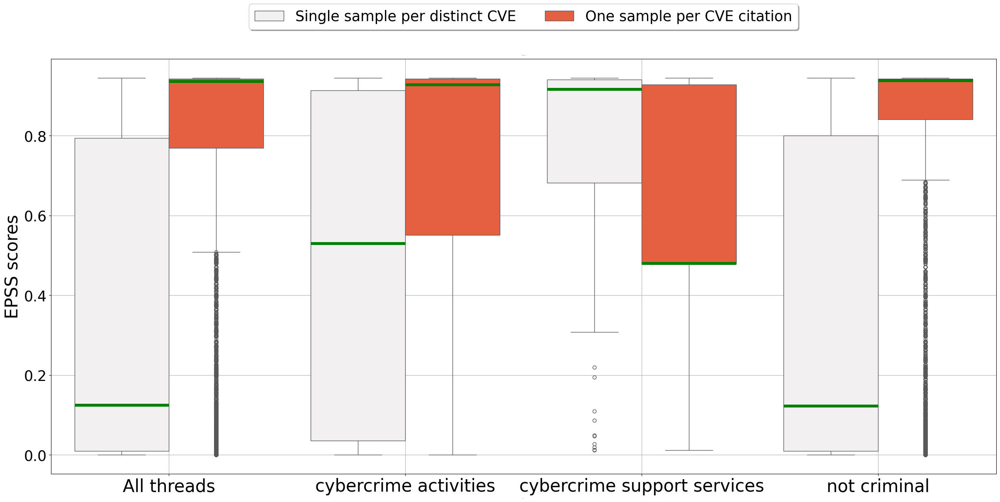

In [59]:
_, ax = plt.subplots(figsize=(24,12), nrows=1, ncols=1, sharex=False, sharey=False, constrained_layout=True)

epss_df = pd.melt(hf_cve_cvss_df, id_vars='index', value_vars=['epss_score_unique', 'epss_score'])
epss_df.rename(columns={"index":"labels"}, inplace=True)
# epss_df.sort_values(by='labels', key=make_sorter(["PoC", "Weaponization", "Exploitation", "All threads"]), inplace=True)
epss_df.sort_values(by='labels', inplace=True)

# Explode the 'value' column
epss_df_exploded = epss_df.explode('value').reset_index(drop=True)

# Convert 'value' column to numeric (explode converts it to object type)
epss_df_exploded['value'] = pd.to_numeric(epss_df_exploded['value'])

# sns_fig_strip = sns.stripplot(data=df,
#                               x="labels", 
#                               y="epss_score",
#                               jitter=True,
#                               size=10,
#                               alpha=0.2,
#                               #palette='husl',
#                               color="black",
#                               ax=ax
#                              )

sns_fig_bar = sns.boxplot(data=epss_df_exploded,
                            x="labels", 
                            y="value", 
                            dodge=True,
                            showfliers=True, 
                            hue="variable",
                            medianprops=dict(color="green", linewidth=5),
                            palette=["#f2f0f0", "#ff4f2600"],
#                             color="tomato",
                            ax=ax
                           )

# adding legend
handles, _ = sns_fig_bar.get_legend_handles_labels() 

sns_fig_bar.legend(handles, ['Single sample per distinct CVE', 'One sample per CVE citation'], 
          loc='upper center', ncols=2, fontsize=25, 
          bbox_to_anchor=(0.5, 1.15), fancybox=True, shadow=True)

sns_fig_bar.set_title(f"EPSS Scores", fontsize=0)
# rotate the axis ticklabels
_ = sns_fig_bar.tick_params(axis='x', rotation=0, labelsize=30)


# rotate the axis ticklabels
_ = sns_fig_bar.tick_params(axis='y', rotation=0, labelsize=25)

sns_fig_bar.yaxis.grid(True)
sns_fig_bar.xaxis.grid(True)
# ax.set_title(f"CVE-CVSS V2 Score by label, Avg: {round(df['cvss_score_V2'].mean(), 2)}", fontsize=30)
sns_fig_bar.set_xlabel('Label', fontsize=0)
sns_fig_bar.set_ylabel(f"EPSS scores", fontsize=30)

Text(0, 0.5, 'CVSS v2 scores')

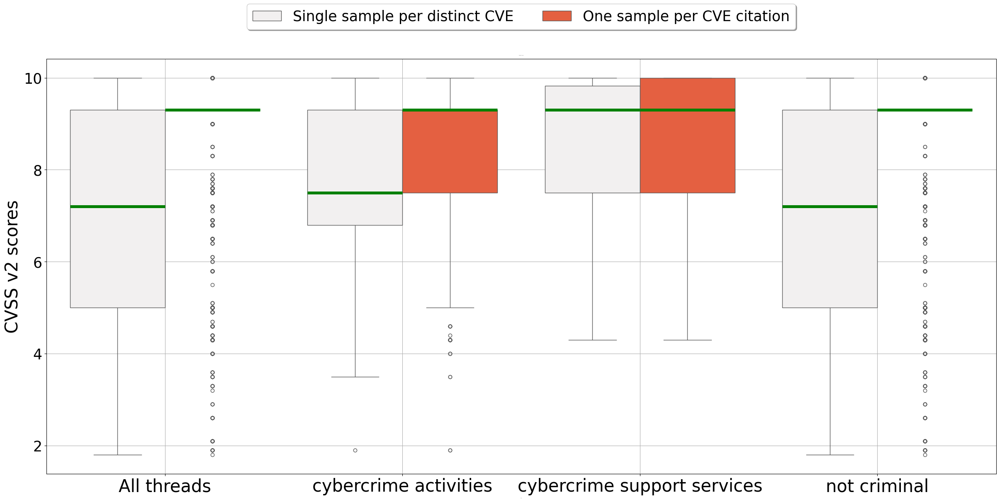

In [60]:
_, ax = plt.subplots(figsize=(24,12), nrows=1, ncols=1, sharex=False, sharey=False, constrained_layout=True)

cvss_v2_df = pd.melt(hf_cve_cvss_df, id_vars='index', value_vars=['cvss_score_V2_unique', 'cvss_score_V2'])
cvss_v2_df.rename(columns={"index":"labels"}, inplace=True)
cvss_v2_df.sort_values(by='labels', inplace=True)

# Explode the 'value' column
cvssv2_df_exploded = cvss_v2_df.explode('value').reset_index(drop=True)

# Convert 'value' column to numeric (explode converts it to object type)
cvssv2_df_exploded['value'] = pd.to_numeric(cvssv2_df_exploded['value'])

sns_fig_bar = sns.boxplot(data=cvssv2_df_exploded,
                            x="labels", 
                            y="value", 
                            dodge=True,
                            showfliers=True, 
                            hue="variable",
                            medianprops=dict(color="green", linewidth=5),
                            palette=["#f2f0f0", "#ff4f2600"],
#                             color="tomato",
                            ax=ax
                           )

# adding legend
handles, _ = ax.get_legend_handles_labels() 

sns_fig_bar.legend(handles, ['Single sample per distinct CVE', 'One sample per CVE citation'], 
          loc='upper center', ncols=2, fontsize=25, 
          bbox_to_anchor=(0.5, 1.15), fancybox=True, shadow=True)

sns_fig_bar.set_title(f"CVSS V2 Scores", fontsize=0)
# rotate the axis ticklabels
_ = sns_fig_bar.tick_params(axis='x', rotation=0, labelsize=30)


# rotate the axis ticklabels
_ = sns_fig_bar.tick_params(axis='y', rotation=0, labelsize=25)

sns_fig_bar.yaxis.grid(True)
sns_fig_bar.xaxis.grid(True)
# ax.set_title(f"CVE-CVSS V2 Score by label, Avg: {round(df['cvss_score_V2'].mean(), 2)}", fontsize=30)
sns_fig_bar.set_xlabel('Label', fontsize=0)
sns_fig_bar.set_ylabel(f"CVSS v2 scores", fontsize=30)

Text(0, 0.5, 'CVSS v3 scores')

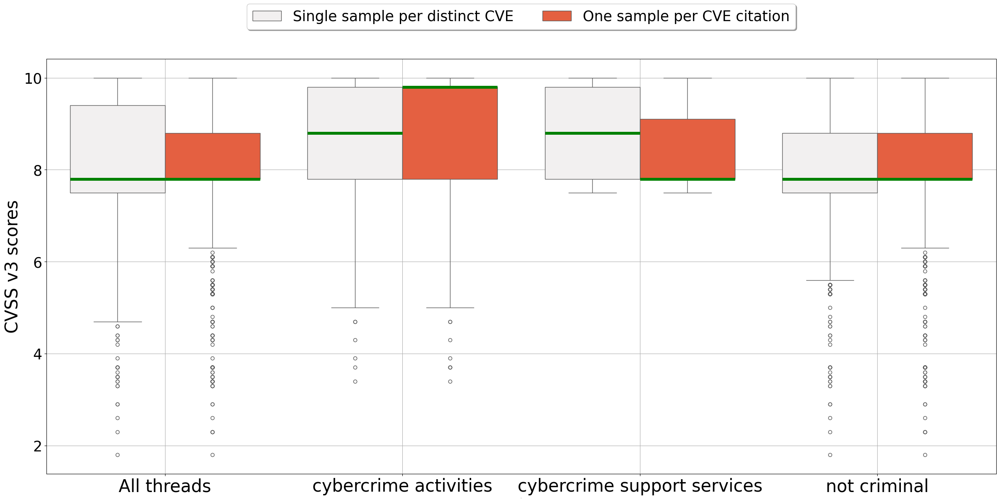

In [61]:
_, ax = plt.subplots(figsize=(24,12), nrows=1, ncols=1, sharex=False, sharey=False, constrained_layout=True)

cvss_v3_df = pd.melt(hf_cve_cvss_df, id_vars='index', value_vars=['cvss_score_V3_unique', 'cvss_score_V3'])
cvss_v3_df.rename(columns={"index":"labels"}, inplace=True)
cvss_v3_df.sort_values(by='labels', inplace=True)

# Explode the 'value' column
cvssv3_df_exploded = cvss_v3_df.explode('value').reset_index(drop=True)

# Convert 'value' column to numeric (explode converts it to object type)
cvssv3_df_exploded['value'] = pd.to_numeric(cvssv3_df_exploded['value'])

sns_fig_bar = sns.boxplot(data=cvssv3_df_exploded,
                            x="labels", 
                            y="value", 
                            dodge=True,
                            showfliers=True, 
                            #notch=True,
                            hue="variable",
                            medianprops=dict(color="green", linewidth=5),
                            palette=["#f2f0f0", "#ff4f2600"],
#                             color="tomato",
                            ax=ax
                           )

# adding legend
handles, _ = ax.get_legend_handles_labels() 

sns_fig_bar.legend(handles, ['Single sample per distinct CVE', 'One sample per CVE citation'], 
          loc='upper center', ncols=2, fontsize=25, 
          bbox_to_anchor=(0.5, 1.15), fancybox=True, shadow=True)


# rotate the axis ticklabels
_ = sns_fig_bar.tick_params(axis='x', rotation=0, labelsize=30)


# rotate the axis ticklabels
_ = sns_fig_bar.tick_params(axis='y', rotation=0, labelsize=25)

sns_fig_bar.yaxis.grid(True)
sns_fig_bar.xaxis.grid(True)
# ax.set_title(f"CVE-CVSS V2 Score by label, Avg: {round(df['cvss_score_V2'].mean(), 2)}", fontsize=30)
sns_fig_bar.set_xlabel('Label', fontsize=0)
sns_fig_bar.set_ylabel(f"CVSS v3 scores", fontsize=30)

Text(0, 0.5, 'CVSS scores')

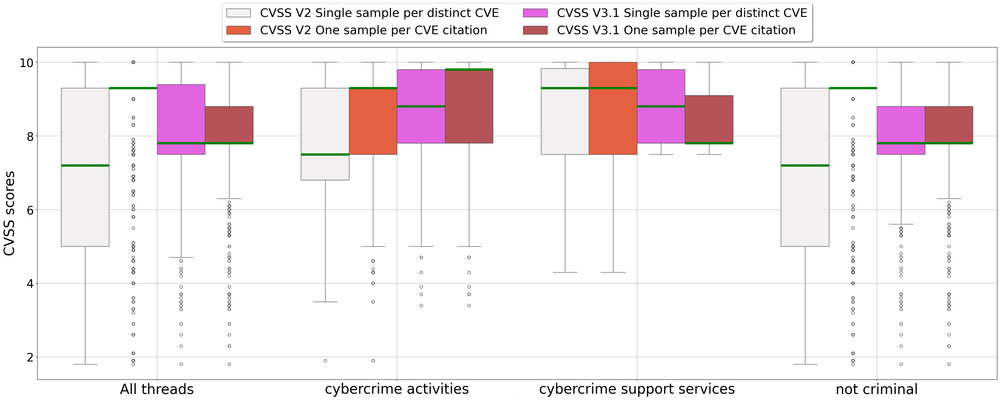

In [62]:
_, ax = plt.subplots(figsize=(30,12), nrows=1, ncols=1, sharex=False, sharey=False, constrained_layout=True)

cvss_v3_df = pd.melt(hf_cve_cvss_df, id_vars='index', value_vars=['cvss_score_V2_unique', 'cvss_score_V2', 'cvss_score_V3_unique', 'cvss_score_V3'])
cvss_v3_df.rename(columns={"index":"labels"}, inplace=True)
cvss_v3_df.sort_values(by='labels', inplace=True)

# Explode the 'value' column
cvssv3_df_exploded = cvss_v3_df.explode('value').reset_index(drop=True)

# Convert 'value' column to numeric (explode converts it to object type)
cvssv3_df_exploded['value'] = pd.to_numeric(cvssv3_df_exploded['value'])

sns_fig_bar = sns.boxplot(data=cvssv3_df_exploded,
                            x="labels", 
                            y="value", 
                            dodge=True,
                            showfliers=True, 
                            hue="variable",
                            medianprops=dict(color="green", linewidth=5),
                            palette=["#f2f0f0", "#ff4f2600", "#f650f4", "#c6424900"],
                            #color="tomato",
                            ax=ax
                           )

# adding legend
handles, _ = ax.get_legend_handles_labels() 

sns_fig_bar.legend(handles, ['CVSS V2 Single sample per distinct CVE', 'CVSS V2 One sample per CVE citation', 'CVSS V3.1 Single sample per distinct CVE', 'CVSS V3.1 One sample per CVE citation'], 
          loc='upper center', ncols=2, fontsize=26, 
          #bbox_to_anchor=(0.5, 1.25), fancybox=True, shadow=True)
           bbox_to_anchor=(0.5, 1.15), fancybox=True, shadow=True)


# rotate the axis ticklabels
_ = sns_fig_bar.tick_params(axis='x', rotation=0, labelsize=30)


# rotate the axis ticklabels
_ = sns_fig_bar.tick_params(axis='y', rotation=0, labelsize=25)

sns_fig_bar.yaxis.grid(True)
sns_fig_bar.xaxis.grid(True)
# ax.set_title(f"CVE-CVSS V2 Score by label, Avg: {round(df['cvss_score_V2'].mean(), 2)}", fontsize=30)
sns_fig_bar.set_xlabel('Label', fontsize=0)
sns_fig_bar.set_ylabel(f"CVSS scores", fontsize=30)

### Quantity distribution CVSS scores

In [63]:
# Data Visualization 
import plotly.express as px
import collections

### Severity CVSS v2: all vs unique

In [85]:
import math

def normalize_key(k):
    if k is None:
        return "nan"
    if isinstance(k, float) and math.isnan(k):
        return "nan"
    if isinstance(k, np.floating) and np.isnan(k):
        return "nan"
    return k

In [90]:
cvss_severity_v2_unique = [ cvss_cve_severity_mapper_v2[cve_code_] for cve_code_ in cve_unique_code_list ]
cvss_severity_v2_unique = [ normalize_key(cve_code_) for cve_code_ in cvss_severity_v2_unique ]
cvss_severity_v2_all = [ cvss_cve_severity_mapper_v2[cve_code_] for cve_code_ in cve_total_code_list ]
cvss_severity_v2_all = [ normalize_key(cve_code_) for cve_code_ in cvss_severity_v2_all ]

In [94]:
counter_dict_v2 = dict(collections.Counter(cvss_severity_v2_unique))

#### Unique

In [95]:
severity_map = {"CRITICAL": "Critical",
                "HIGH": "High",
                "MEDIUM": "Medium",
                "LOW": "Low",
                "nan":"Not found"}

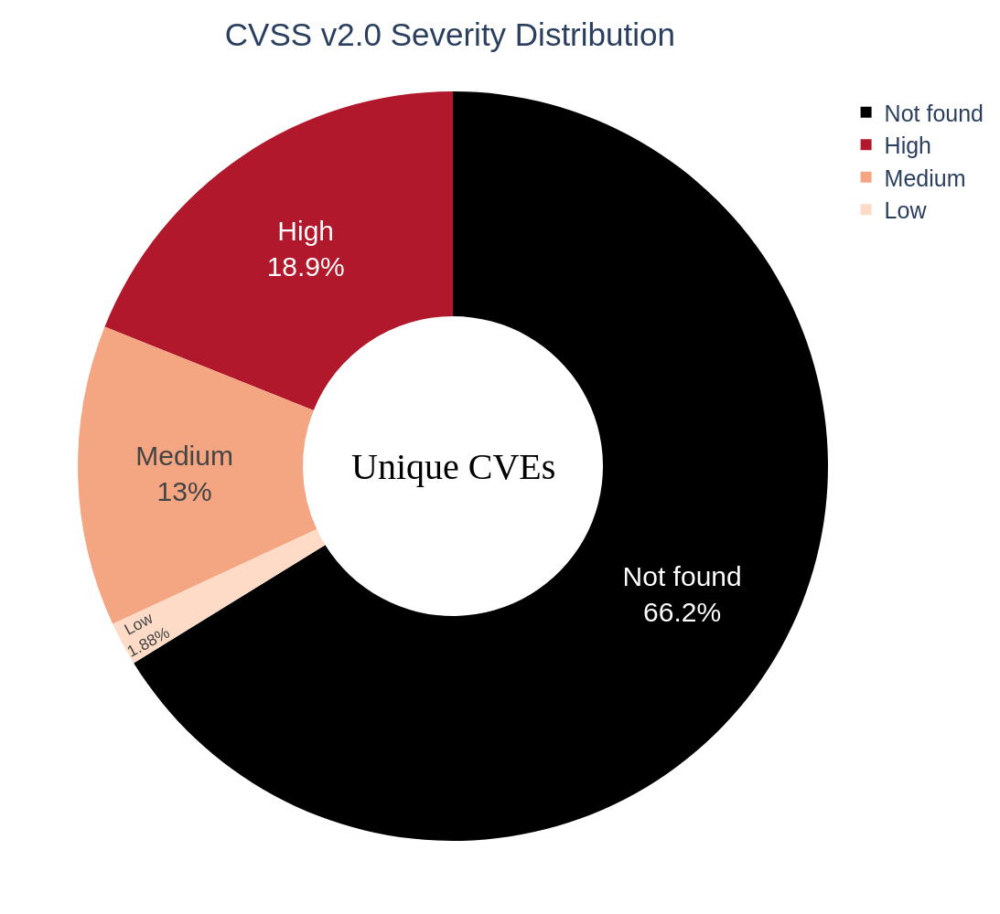

In [96]:
df_v2 = pd.DataFrame({"class": [ str(a) for a in list(counter_dict_v2.keys())], "quantity": list(counter_dict_v2.values())})
df_v2["class"] = df_v2["class"].map(severity_map)

fig = px.pie(
    df_v2,
    names="class",
    values="quantity",
    color="class",
    hole = 0.4,
    color_discrete_map= {'Not found': 'black',
                         'Critical': 'rgb(103,0,31)',
                         'High': 'rgb(178,24,43)',
                         'Medium': 'rgb(244,165,130)',
                         'Low': 'rgb(253,219,199)',
                        },
#     color_discrete_sequence=px.colors.sequential.RdBu,
    title=f'CVSS v2.0 Severity Distribution'
)

fig.update_layout({'title':{'x':0.45}},
                   autosize=True,
                   width=1000,
                   height=1000,
                   font=dict(
#                         family="Courier New, monospace",
                        size=25,
#                         color="RebeccaPurple"
                   )
                 )

fig.update_traces(hoverinfo='label+percent+text',
                  textfont_size=30,
                   textinfo='label+percent+text')

fig.update_traces(textposition='inside')

fig.add_annotation(x= 0.5, y = 0.5,
                    text = f'Unique {cfg.TOPIC_SEARCH.upper()}s',
                    font = dict(size=40,family='Verdana', color='black'),
                    showarrow = False)

# fig.write_image(f"{IMG_PATH}/unique_CVSS_V2.png")
# fig.write_html(f"{IMG_PATH}/unique_CVSS_V2.html", auto_open=False)

#### All

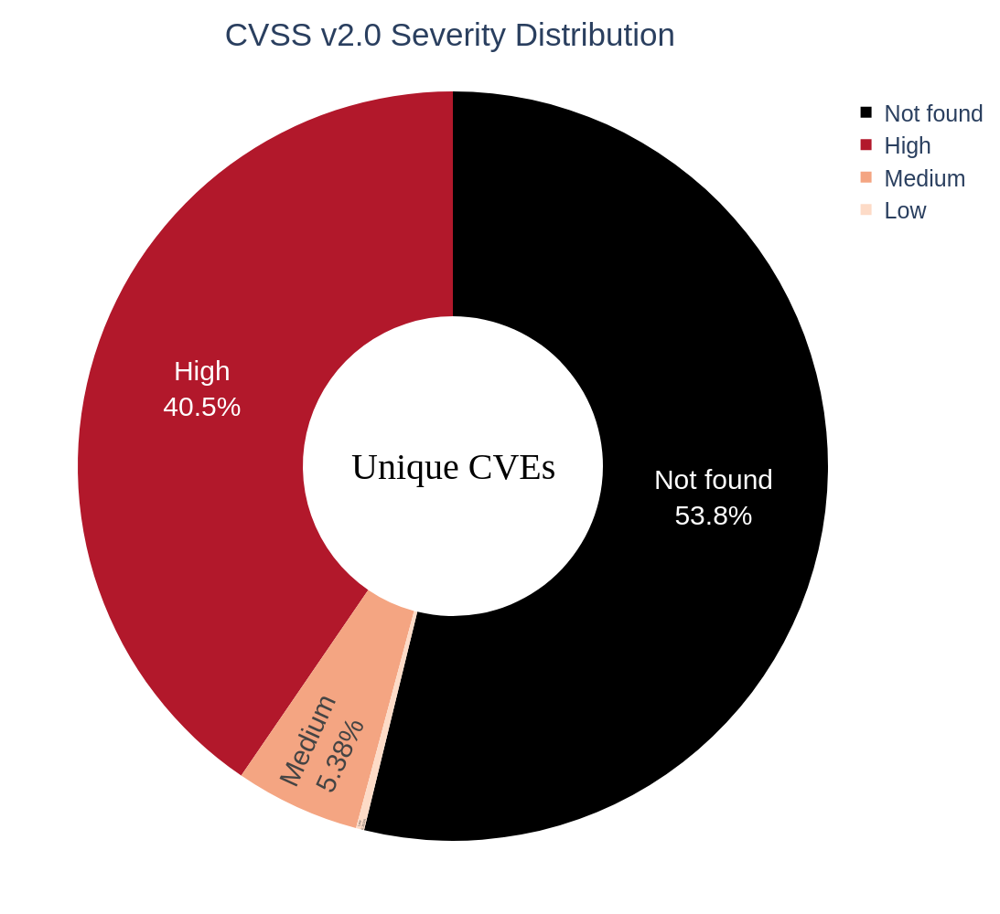

In [98]:
counter_dict_v2 = dict(collections.Counter(cvss_severity_v2_all))

df_v2 = pd.DataFrame({"class": [ str(a) for a in list(counter_dict_v2.keys())], "quantity": list(counter_dict_v2.values())})
df_v2["class"] = df_v2["class"].map(severity_map)

fig = px.pie(
    df_v2,
    names="class",
    values="quantity",
    color="class",
    hole = 0.4,
    color_discrete_map= {'Not found': 'black',
                         'Critical': 'rgb(103,0,31)',
                         'High': 'rgb(178,24,43)',
                         'Medium': 'rgb(244,165,130)',
                         'Low': 'rgb(253,219,199)',
                        },
#     color_discrete_sequence=px.colors.sequential.RdBu,
    title=f'CVSS v2.0 Severity Distribution'
)

fig.update_layout({'title':{'x':0.45}},
                   autosize=True,
                   width=1000,
                   height=1000,
                   font=dict(
#                         family="Courier New, monospace",
                        size=25,
#                         color="RebeccaPurple"
                   )
                 )

fig.update_traces(hoverinfo='label+percent+text',
                  textfont_size=30,
                   textinfo='label+percent+text')

fig.update_traces(textposition='inside')

fig.add_annotation(x= 0.5, y = 0.5,
                    text = f'Unique {cfg.TOPIC_SEARCH.upper()}s',
                    font = dict(size=40,family='Verdana', color='black'),
                    showarrow = False)

# fig.write_image(f"{IMG_PATH}/unique_CVSS_V2.png")
# fig.write_html(f"{IMG_PATH}/unique_CVSS_V2.html", auto_open=False)

In [99]:
cvss_severity_null_v2 = [ cve_code_ for cve_code_, value in cvss_cve_severity_mapper_v2.items() if type(value)==float]
len(cvss_severity_null_v2), np.sort(list(set(cvss_severity_null_v2)))

(0, array([], dtype=float64))

### Severity CVSS v3: all vs unique

In [103]:
cvss_severity_v3_unique = [ cvss_cve_severity_mapper_v3[cve_code_] for cve_code_ in cve_unique_code_list ]
cvss_severity_v3_unique = [ normalize_key(cve_code_) for cve_code_ in cvss_severity_v2_unique ]
cvss_severity_v3_all = [ cvss_cve_severity_mapper_v3[cve_code_] for cve_code_ in cve_total_code_list ]
cvss_severity_v3_all = [ normalize_key(cve_code_) for cve_code_ in cvss_severity_v3_all ]

#### Unique

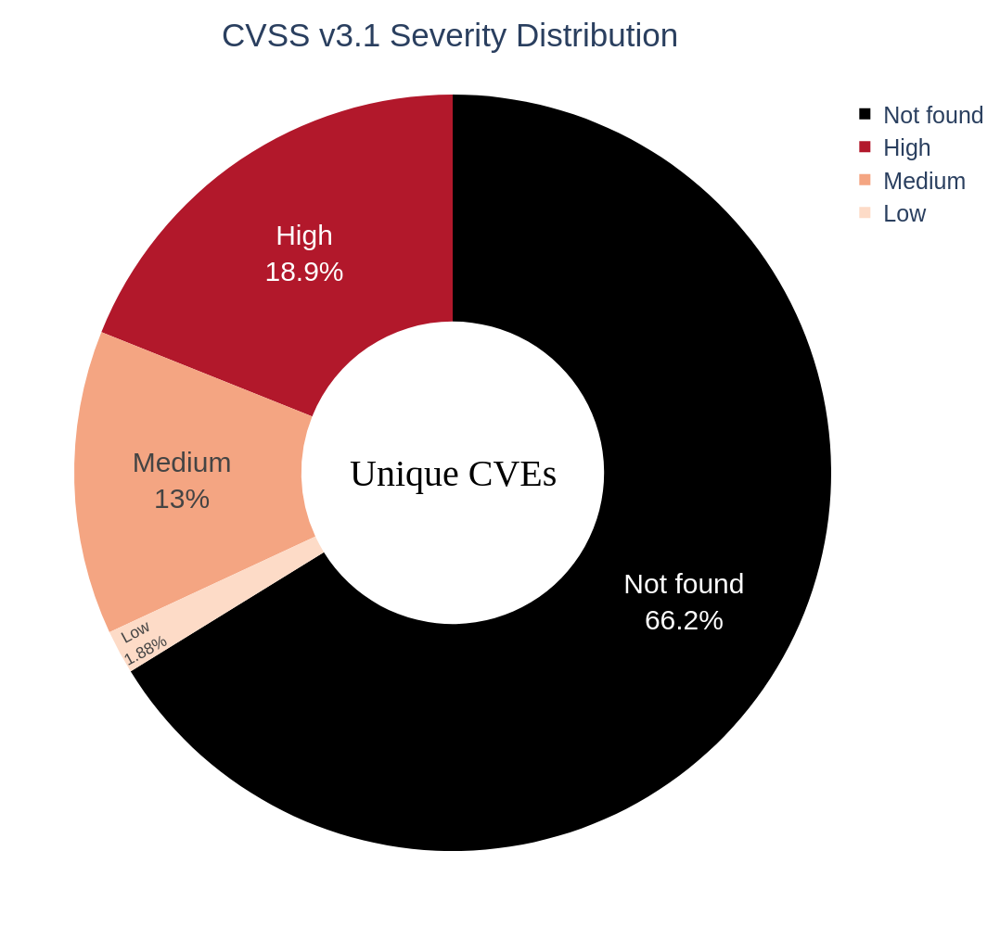

In [104]:
counter_dict_v2 = dict(collections.Counter(cvss_severity_v3_unique))

df_v2 = pd.DataFrame({"class": [ str(a) for a in list(counter_dict_v2.keys())], "quantity": list(counter_dict_v2.values())})
df_v2["class"] = df_v2["class"].map(severity_map)

fig = px.pie(
    df_v2,
    names="class",
    values="quantity",
    color="class",
    hole = 0.4,
    color_discrete_map= {'Not found': 'black',
                         'Critical': 'rgb(103,0,31)',
                         'High': 'rgb(178,24,43)',
                         'Medium': 'rgb(244,165,130)',
                         'Low': 'rgb(253,219,199)',
                        },
#     color_discrete_sequence=px.colors.sequential.RdBu,
    title=f'CVSS v3.1 Severity Distribution'
)

fig.update_layout({'title':{'x':0.45}},
                   autosize=True,
                   width=1000,
                   height=1000,
                   font=dict(
#                         family="Courier New, monospace",
                        size=25,
#                         color="RebeccaPurple"
                   )
                 )

fig.update_traces(hoverinfo='label+percent+text',
                  textfont_size=30,
                   textinfo='label+percent+text')

fig.update_traces(textposition='inside')

fig.add_annotation(x= 0.5, y = 0.5,
                    text = f'Unique {cfg.TOPIC_SEARCH.upper()}s',
                    font = dict(size=40,family='Verdana', color='black'),
                    showarrow = False)

# fig.write_image(f"{IMG_PATH}/unique_CVSS_V2.png")
# fig.write_html(f"{IMG_PATH}/unique_CVSS_V2.html", auto_open=False)

#### All

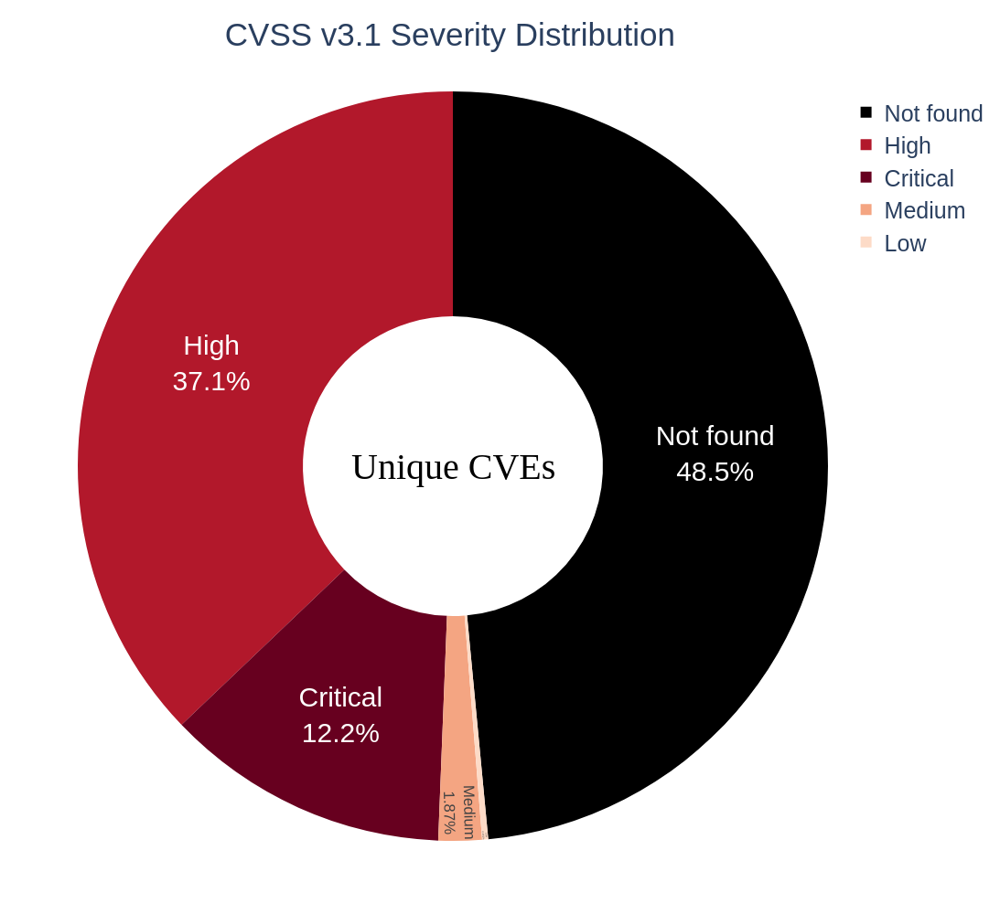

In [106]:
counter_dict_v2 = dict(collections.Counter(cvss_severity_v3_all))

df_v2 = pd.DataFrame({"class": [ str(a) for a in list(counter_dict_v2.keys())], "quantity": list(counter_dict_v2.values())})
df_v2["class"] = df_v2["class"].map(severity_map)

fig = px.pie(
    df_v2,
    names="class",
    values="quantity",
    color="class",
    hole = 0.4,
    color_discrete_map= {'Not found': 'black',
                         'Critical': 'rgb(103,0,31)',
                         'High': 'rgb(178,24,43)',
                         'Medium': 'rgb(244,165,130)',
                         'Low': 'rgb(253,219,199)',
                        },
#     color_discrete_sequence=px.colors.sequential.RdBu,
    title=f'CVSS v3.1 Severity Distribution'
)

fig.update_layout({'title':{'x':0.45}},
                   autosize=True,
                   width=1000,
                   height=1000,
                   font=dict(
#                         family="Courier New, monospace",
                        size=25,
#                         color="RebeccaPurple"
                   )
                 )

fig.update_traces(hoverinfo='label+percent+text',
                  textfont_size=30,
                   textinfo='label+percent+text')

fig.update_traces(textposition='inside')

fig.add_annotation(x= 0.5, y = 0.5,
                    text = f'Unique {cfg.TOPIC_SEARCH.upper()}s',
                    font = dict(size=40,family='Verdana', color='black'),
                    showarrow = False)

# fig.write_image(f"{IMG_PATH}/unique_CVSS_V2.png")
# fig.write_html(f"{IMG_PATH}/unique_CVSS_V2.html", auto_open=False)

In [107]:
cvss_severity_null_v3 = [ cve_code_.split("-")[1] for cve_code_, value in cvss_cve_severity_mapper_v3.items() if type(value)==float]
len(cvss_severity_null_v3), np.sort(list(set(cvss_severity_null_v3)))

(0, array([], dtype=float64))

In [108]:
cvss_severity_not_null_v3 = [ cve_code_.split("-")[1] for cve_code_, value in cvss_cve_severity_mapper_v3.items() if type(value)==str]
len(cvss_severity_not_null_v3), np.sort(list(set(cvss_severity_not_null_v3)))

(967,
 array(['2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013',
        '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021',
        '2022', '2023', '2024'], dtype='<U4'))

### Temporal EPSS and CVSS Analysis

#### Mapping

In [109]:
cve_codes_year_df["cve_codes_epss"] = cve_codes_year_df["cve_codes"].apply(lambda x: list(filter(None,map(epss_cve_mapper.get,x))))
cve_codes_year_df["cve_codes_epss_unique"] = cve_codes_year_df["cve_codes_unique"].apply(lambda x: list(filter(None,map(epss_cve_mapper.get,x))))

cve_codes_year_df["cve_codes_cvss_v2"] = cve_codes_year_df["cve_codes"].apply(lambda x: list(filter(None,map(cvss_cve_mapper_v2.get,x))))
cve_codes_year_df["cve_codes_cvss_v2_unique"] = cve_codes_year_df["cve_codes_unique"].apply(lambda x: list(filter(None,map(cvss_cve_mapper_v2.get,x))))
cve_codes_year_df["cve_codes_cvss_severity_v2"] = cve_codes_year_df["cve_codes_unique"].apply(lambda x: list(filter(None,map(cvss_cve_severity_mapper_v2.get,x))))
cve_codes_year_df["cve_codes_cvss_impact_v2"] = cve_codes_year_df["cve_codes_unique"].apply(lambda x: list(filter(None,map(cvss_cve_impact_mapper_v2.get,x))))
cve_codes_year_df["cve_codes_cvss_exploit_v2"] = cve_codes_year_df["cve_codes_unique"].apply(lambda x: list(filter(None,map(cvss_cve_exploit_mapper_v2.get,x))))

cve_codes_year_df["cve_codes_cvss_v3"] = cve_codes_year_df["cve_codes"].apply(lambda x: list(filter(None,map(cvss_cve_mapper_v3.get,x))))
cve_codes_year_df["cve_codes_cvss_v3_unique"] = cve_codes_year_df["cve_codes_unique"].apply(lambda x: list(filter(None,map(cvss_cve_mapper_v3.get,x))))
cve_codes_year_df["cve_codes_cvss_severity_v3"] = cve_codes_year_df["cve_codes_unique"].apply(lambda x: list(filter(None,map(cvss_cve_severity_mapper_v3.get,x))))
cve_codes_year_df["cve_codes_cvss_impact_v3"] = cve_codes_year_df["cve_codes_unique"].apply(lambda x: list(filter(None,map(cvss_cve_impact_mapper_v3.get,x))))
cve_codes_year_df["cve_codes_cvss_exploit_v3"] = cve_codes_year_df["cve_codes_unique"].apply(lambda x: list(filter(None,map(cvss_cve_exploit_mapper_v3.get,x))))

#### Removing Nulls

In [110]:
cve_codes_year_df["cve_codes_epss"] = cve_codes_year_df["cve_codes_epss"].apply(lambda x: [a for a in x if a is not None and not np.isnan(a)])
cve_codes_year_df["cve_codes_epss_unique"] = cve_codes_year_df["cve_codes_epss_unique"].apply(lambda x: [a for a in x if a is not None and not np.isnan(a)])

cve_codes_year_df["cve_codes_cvss_v2"] = cve_codes_year_df["cve_codes_cvss_v2"].apply(lambda x: [a for a in x if a is not None and not np.isnan(a)])
cve_codes_year_df["cve_codes_cvss_v2_unique"] = cve_codes_year_df["cve_codes_cvss_v2_unique"].apply(lambda x: [a for a in x if a is not None and not np.isnan(a)])
cve_codes_year_df["cve_codes_cvss_severity_v2"] = cve_codes_year_df["cve_codes_cvss_severity_v2"].apply(lambda x: [a for a in x if a is not None])
cve_codes_year_df["cve_codes_cvss_impact_v2"] = cve_codes_year_df["cve_codes_cvss_impact_v2"].apply(lambda x: [a for a in x if a is not None and not np.isnan(a)])
cve_codes_year_df["cve_codes_cvss_exploit_v2"] = cve_codes_year_df["cve_codes_cvss_exploit_v2"].apply(lambda x: [a for a in x if a is not None and not np.isnan(a)])

cve_codes_year_df["cve_codes_cvss_v3"] = cve_codes_year_df["cve_codes_cvss_v3"].apply(lambda x: [a for a in x if a is not None and not np.isnan(a)])
cve_codes_year_df["cve_codes_cvss_v3_unique"] = cve_codes_year_df["cve_codes_cvss_v3_unique"].apply(lambda x: [a for a in x if a is not None and not np.isnan(a)])
cve_codes_year_df["cve_codes_cvss_severity_v3"] = cve_codes_year_df["cve_codes_cvss_severity_v3"].apply(lambda x: [a for a in x if a is not None])
cve_codes_year_df["cve_codes_cvss_impact_v3"] = cve_codes_year_df["cve_codes_cvss_impact_v3"].apply(lambda x: [a for a in x if a is not None and not np.isnan(a)])
cve_codes_year_df["cve_codes_cvss_exploit_v3"] = cve_codes_year_df["cve_codes_cvss_exploit_v3"].apply(lambda x: [a for a in x if a is not None and not np.isnan(a)])

#### EPSS

Text(0, 0.5, 'EPSS Score')

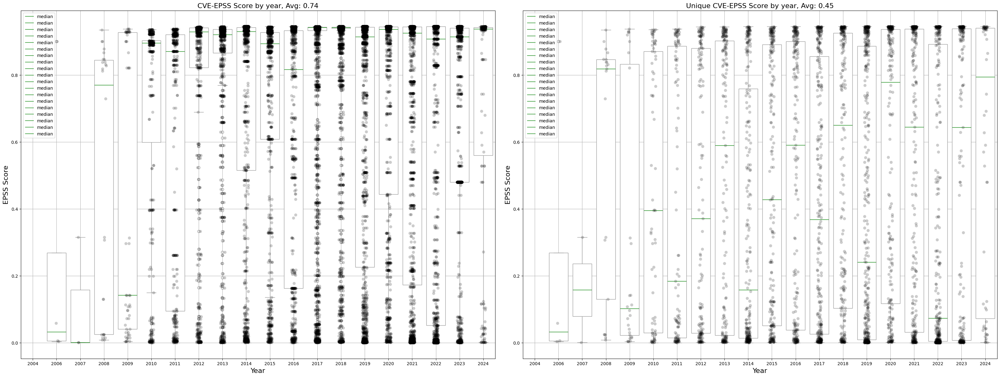

In [111]:
_, ax = plt.subplots(figsize=(32,12), nrows=1, ncols=2, sharex=True, sharey=False, constrained_layout=True)

df = cve_codes_year_df.explode('cve_codes_epss').reset_index()

sns.stripplot(data=df,
                    x="year", 
                    y="cve_codes_epss",
                    jitter=True,
                    size=7,
                    alpha=0.2,
                    #palette='husl',
                    color="black",
                    ax=ax[0])

sns.boxplot(data=df,
                    x="year", 
                    y="cve_codes_epss", 
                    dodge=False,
                    showfliers=True, 
                    medianprops=dict(color="green", label='median'),
#                     palette='husl',
                    color="white",
                    ax=ax[0]
                   )

ax[0].yaxis.grid(True)
ax[0].xaxis.grid(True)
ax[0].set_title(f"CVE-EPSS Score by year, Avg: {round(df['cve_codes_epss'].mean(), 2)}", fontsize=16)
ax[0].set_xlabel('Year', fontsize=16)
ax[0].set_ylabel(f"EPSS Score", fontsize=16)

df = cve_codes_year_df.explode('cve_codes_epss_unique').reset_index()

sns.stripplot(data=df,
                    x="year", 
                    y="cve_codes_epss_unique",
                    jitter=True,
                    size=7,
                    alpha=0.2,
                    #palette='husl',
                    color="black",
                    ax=ax[1])

sns.boxplot(data=df,
                    x="year", 
                    y="cve_codes_epss_unique", 
                    dodge=False,
                    showfliers=True, 
                    medianprops=dict(color="green", label='median'),
#                     palette='husl',
                    color="white",
                    ax=ax[1]
                   )

ax[1].yaxis.grid(True)
ax[1].xaxis.grid(True)
ax[1].set_title(f"Unique CVE-EPSS Score by year, Avg: {round(df['cve_codes_epss_unique'].mean(), 2)}", fontsize=16)
ax[1].set_xlabel('Year', fontsize=16)
ax[1].set_ylabel(f"EPSS Score", fontsize=16)

#### CVSS V2

Text(0, 0.5, 'CVSS v2 Score')

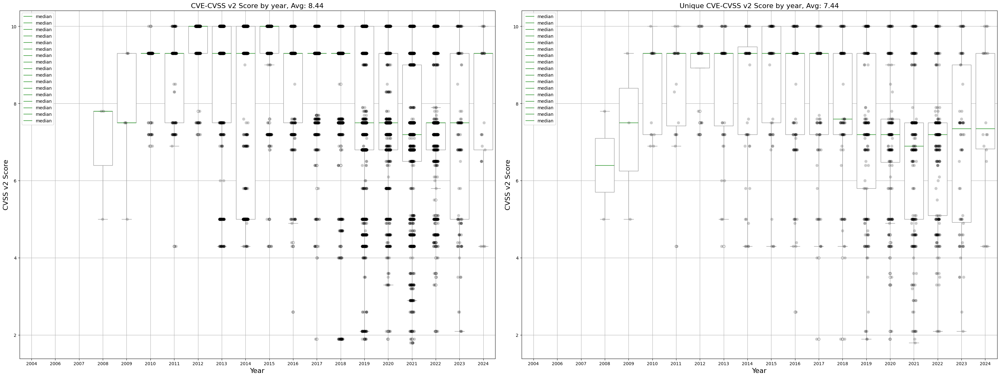

In [112]:
_, ax = plt.subplots(figsize=(32,12), nrows=1, ncols=2, sharex=True, sharey=False, constrained_layout=True)

df = cve_codes_year_df.explode('cve_codes_cvss_v2').reset_index()

sns.stripplot(data=df,
                    x="year", 
                    y="cve_codes_cvss_v2",
                    jitter=True,
                    size=7,
                    alpha=0.2,
                    #palette='husl',
                    color="black",
                    ax=ax[0])

sns.boxplot(data=df,
                    x="year", 
                    y="cve_codes_cvss_v2", 
                    dodge=False,
                    showfliers=True, 
                    medianprops=dict(color="green", label='median'),
#                     palette='husl',
                    color="white",
                    ax=ax[0]
                   )

ax[0].yaxis.grid(True)
ax[0].xaxis.grid(True)
ax[0].set_title(f"CVE-CVSS v2 Score by year, Avg: {round(df['cve_codes_cvss_v2'].mean(), 2)}", fontsize=16)
ax[0].set_xlabel('Year', fontsize=16)
ax[0].set_ylabel(f"CVSS v2 Score", fontsize=16)

df = cve_codes_year_df.explode('cve_codes_cvss_v2_unique').reset_index()

sns.stripplot(data=df,
                    x="year", 
                    y="cve_codes_cvss_v2_unique",
                    jitter=True,
                    size=7,
                    alpha=0.2,
                    #palette='husl',
                    color="black",
                    ax=ax[1])

sns.boxplot(data=df,
                    x="year", 
                    y="cve_codes_cvss_v2_unique", 
                    dodge=False,
                    showfliers=True, 
                    medianprops=dict(color="green", label='median'),
#                     palette='husl',
                    color="white",
                    ax=ax[1]
                   )

ax[1].yaxis.grid(True)
ax[1].xaxis.grid(True)
ax[1].set_title(f"Unique CVE-CVSS v2 Score by year, Avg: {round(df['cve_codes_cvss_v2_unique'].mean(), 2)}", fontsize=16)
ax[1].set_xlabel('Year', fontsize=16)
ax[1].set_ylabel(f"CVSS v2 Score", fontsize=16)

#### CVSS v3.1

Text(0, 0.5, 'CVSS v3.1 Score')

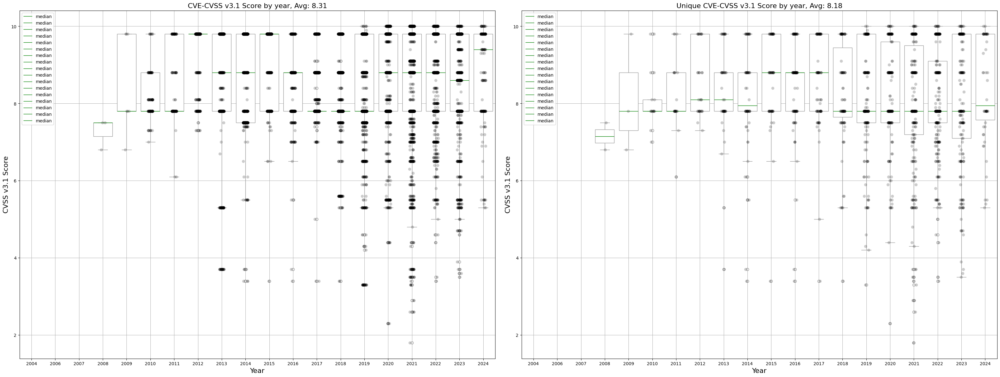

In [113]:
_, ax = plt.subplots(figsize=(32,12), nrows=1, ncols=2, sharex=True, sharey=False, constrained_layout=True)

df = cve_codes_year_df.explode('cve_codes_cvss_v3').reset_index()

sns.stripplot(data=df,
                    x="year", 
                    y="cve_codes_cvss_v3",
                    jitter=True,
                    size=7,
                    alpha=0.2,
                    #palette='husl',
                    color="black",
                    ax=ax[0])

sns.boxplot(data=df,
                    x="year", 
                    y="cve_codes_cvss_v3", 
                    dodge=False,
                    showfliers=True, 
                    medianprops=dict(color="green", label='median'),
#                     palette='husl',
                    color="white",
                    ax=ax[0]
                   )

ax[0].yaxis.grid(True)
ax[0].xaxis.grid(True)
ax[0].set_title(f"CVE-CVSS v3.1 Score by year, Avg: {round(df['cve_codes_cvss_v3'].mean(), 2)}", fontsize=16)
ax[0].set_xlabel('Year', fontsize=16)
ax[0].set_ylabel(f"CVSS v3.1 Score", fontsize=16)

df = cve_codes_year_df.explode('cve_codes_cvss_v3_unique').reset_index()

sns.stripplot(data=df,
                    x="year", 
                    y="cve_codes_cvss_v3_unique",
                    jitter=True,
                    size=7,
                    alpha=0.2,
                    #palette='husl',
                    color="black",
                    ax=ax[1])

sns.boxplot(data=df,
                    x="year", 
                    y="cve_codes_cvss_v3_unique", 
                    dodge=False,
                    showfliers=True, 
                    medianprops=dict(color="green", label='median'),
#                     palette='husl',
                    color="white",
                    ax=ax[1]
                   )

ax[1].yaxis.grid(True)
ax[1].xaxis.grid(True)
ax[1].set_title(f"Unique CVE-CVSS v3.1 Score by year, Avg: {round(df['cve_codes_cvss_v3_unique'].mean(), 2)}", fontsize=16)
ax[1].set_xlabel('Year', fontsize=16)
ax[1].set_ylabel(f"CVSS v3.1 Score", fontsize=16)